<a href="https://colab.research.google.com/github/BungPeerapat/Python_AI_Learn/blob/main/data_collection_botnoi_cvGroup6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Collection 


1.   ดึง url ของรูปที่ต้องการค้นหา (query)
2.   สกัด feature ,บันทึกรูป และ feature ที่ได้ใน Mounted Google Drive หรือ colab
3.   ตรวจสอบความถูกต้องของรูปที่ดึงมา และทำการลบรูปและ feature ที่ใช้ไม่ได้



In [ ]:
!pip install botnoi==0.2.1

     |████████████████████████████████| 16.0MB 186kB/s 


In [ ]:
from botnoi import scrape as sc
from botnoi import cv
import os

In [ ]:
# (optional) Mount Drive ไปยัง account ที่ต้องการเก็บข้อมูล
from google.colab import drive
drive.mount('/content/drive')

## 1.ดึง url ของรูปที่ต้องการค้นหา (query)

In [ ]:
# กำหนด query = ชื่อของข้อมูลที่ต้องการค้นหา
# กำหนด className = ชื่อโฟลเดอร์ที่เราต้องการจัดเก็บ
# กำหนด imgNum = จำนวนรูปที่ต้องการค้นหา

query = 'Euphorbia milii Des Moul'
className = 'Euphorbia_milii_Des_Moul'
imgNum = 120

In [ ]:
# สร้าง list ของ url ของรูปที่ทำการค้นหา
imgList = sc.get_image_urls(query, imgNum)

complete: 0.00%
complete: 55.83%
completed


In [ ]:
imgList

['https://worldofsucculents.com/wp-content/uploads/2013/04/Euphorbia-milii-Crown-of-Thorns.jpg',
 'https://gardenbeast.com/wp-content/uploads/2020/07/thorns.jpg',
 'https://thumbs.dreamstime.com/b/euphorbia-milii-flowers-crown-thorns-christ-plant-siamese-lucky-des-moul-pink-white-bright-green-flower-buds-ready-to-bloom-135935040.jpg',
 'https://toptropicals.com/pics/misc/thailand/euphorbia/7229.jpg',
 'https://toptropicals.com/pics/misc/thailand/euphorbia/5349.jpg',
 'https://i.pinimg.com/originals/6f/36/05/6f36058379b803cabe1f127c6c9fe49a.jpg',
 'https://www.zimbabweflora.co.zw/speciesdata/images/13/136180-5.jpg',
 'https://2.bp.blogspot.com/-cPKIHluMwcA/ULWQp-JRXlI/AAAAAAAAFy4/k4xUKGQz2TA/w1200-h630-p-k-no-nu/Euphorbia-milii-Christ-Plant-Christ-Thorn-Corona-de-Cristo.jpg',
 'https://worldoffloweringplants.com/wp-content/uploads/2017/12/Euphorbia-milii-Crown-of-Thorns2.jpg',
 'https://commons.wikimedia.org/wiki/File:Euphorbia_milii_Des_Moul..jpg',
 'https://image.freepik.com/free-phot

### แสดงรูปจาก urls ใน imgList

In [ ]:
def getthumbdisplay(imgList):
  res = ''
  for img in imgList:
    res = res + gethtmlimage(img)
  return res

In [ ]:
def gethtmlimage(imgurl):
  htmlTag = '''
  <a target="_blank" href="%s">
    <img src="%s" alt="Forest">
  </a>
  '''%(imgurl,imgurl)
  return htmlTag


In [ ]:
import IPython
from google.colab import output
htmlimage = getthumbdisplay(imgList)
html = '''<style>
img {
  border: 1px solid #ddd; /* Gray border */
  border-radius: 4px;  /* Rounded border */
  padding: 5px; /* Some padding */
  width: 150px; /* Set a small width */
}

/* Add a hover effect (blue shadow) */
img:hover {
  box-shadow: 0 0 2px 1px rgba(0, 140, 186, 0.5);
}
</style>
<body>

%s

</body>'''%htmlimage
display(IPython.display.HTML(html))

## 2.ทำ extract feature และบันทึก

In [ ]:
import urllib.request

In [ ]:
# เลือกที่จัดเก็บรูป และ feature

# กรณีที่ 1 : บันทึกรูปภาพ และ feature ไปที่ mounted drive
imgFolder = '/content/drive/MyDrive/Datasets/Image/'
featFolder = '/content/drive/MyDrive/Datasets/Data/'

# กรณีที่ 2 : บันทึกรูปภาพ และ feature ใน colab
#imgFolder = '/content/Datasets/Image/'
#featFolder = '/content/Datasets/Data/'

In [ ]:
def extractimagefeat(query,range):
  
  #create folder for images
  foldername = imgFolder + className
  isdir = os.path.isdir(foldername)  
  #check if folder exist
  if not isdir:
    #create directory
    os.makedirs(foldername)

  #create folder for features 
  folderDataname = featFolder + className
  isdirdata = os.path.isdir(folderDataname) 
  if not isdirdata:
    #create directory
    os.makedirs(folderDataname)

  #get images from google search
  imglist = sc.get_image_urls(query,range)
  i = 1
  for img in imglist[0:range] :
    #extract image features from each images and save to files
    try:
      print(i)
      #create image path and save
      savepath = foldername + '/' + className + '_'+str(i)+'.jpeg'
      urllib.request.urlretrieve(img, savepath)

      # create data path and save
      savepathData = folderDataname+ '/' + className + '_'+str(i)+'.p'
      
      a = cv.image(img)
      a.getresnet50()
      a.save(savepathData)
      i = i + 1
    except:
      i = i + 1
      pass
  return 'complete'

In [ ]:
extractimagefeat(query,imgNum) #extractimagefeat('ชื่อของข้อมูลที่ต้องการค้นหา',ขอบเขตของรูปที่ต้องการหา)

complete: 0.00%
complete: 55.83%
completed
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120


'complete'

## 3.ตรวจสอบความถูกต้อง และลบรูปและ feature ที่ใช้ไม่ได้


### plot รูปจาก folder Image เพื่อคัดรูปที่ใช้ไม่ได้

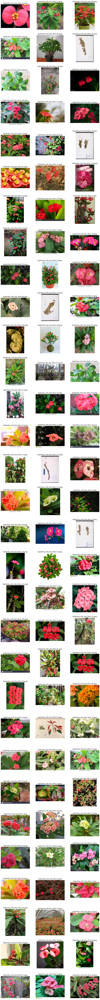

In [ ]:
# สามารถกดซ้ำได้เพื่อตรวจสอบความเรียบร้อย หลังจากการลบรูปแล้ว

import matplotlib.pyplot as plt
import PIL
%matplotlib inline

plt.figure(figsize=(15, (imgNum // 3) * 4 ))
for i, imgName in enumerate(os.listdir(imgFolder + className)) :
  try:
    img = PIL.Image.open(os.path.join(imgFolder + className, imgName))
    plt.subplot(len(os.listdir(imgFolder + className))//3 + 1, 3, i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(imgName.split('/')[-1])
  except:
    print('loading image : ', imgName ,' has an error') 
plt.show()

### ลบรูปและ feature ที่ใช้ไม่ได้

In [ ]:
# เช็คจากรูปที่ plot ออกมา ต้องการลบรูปใดให้ใส่ index ของรูปนั้นใน list ด้านล่าง
indexToDelete = [23,9,26,35,77,103,114,87,106,60,37,32] 

In [ ]:
for idx in indexToDelete :
  imgFileName = imgFolder + className+'/'+className + '_'+str(idx)+'.jpeg'
  dataFileName = featFolder + className+'/'+className + '_'+str(idx)+'.p'
  
  if os.path.exists(imgFileName) :
    #print(imgFileName, ' exists')
    os.remove(imgFileName)

  if os.path.exists(dataFileName) :
    #print(dataFileName, ' exists')
    os.remove(dataFileName)

Note : สามารถทำการ recheck ด้วยการ plot รูปอีกครั้ง 

# Credit
*Created by น้อง Man-U & Botnoi CV Group 6*